In [2]:
#catscatscats

from skimage import io
from skimage.util import img_as_ubyte
import matplotlib.pyplot as plt
import numpy as np
import glob
from sklearn.decomposition import PCA
from skimage.transform import SimilarityTransform
from skimage.transform import warp
import os
import pathlib

from preprocessing import *


In [6]:
raw_dir = "data/training_cats_100/"
preprocess_dir = "preprocess_dir"

if not os.path.exists(preprocess_dir):
    os.makedirs(preprocess_dir)
    
preprocess_all_cats(raw_dir, preprocess_dir)

In [7]:
files = glob.glob(f"{preprocess_dir}/*.jpg")

height, width, channels = io.imread(files[0]).shape
data_matrix = np.zeros((len(files), height * width * channels))
for i, f in enumerate(files):
    data_matrix[i, :] = io.imread(f).flatten()

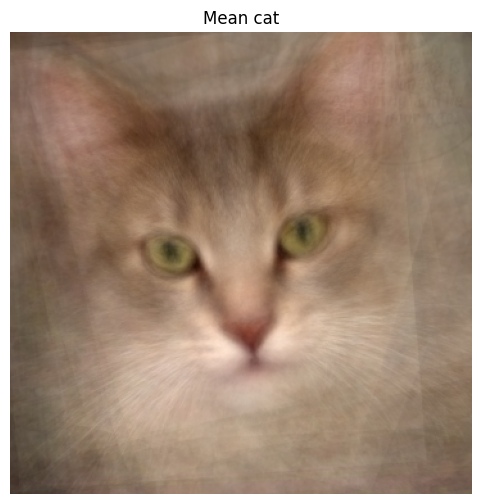

In [9]:
average_cat = np.mean(data_matrix, axis=0)
average_cat_img = create_u_byte_image_from_vector(average_cat, height, width, channels)
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plt.imshow(average_cat_img)
ax.set_title("Mean cat")
ax.set_axis_off()
plt.show()

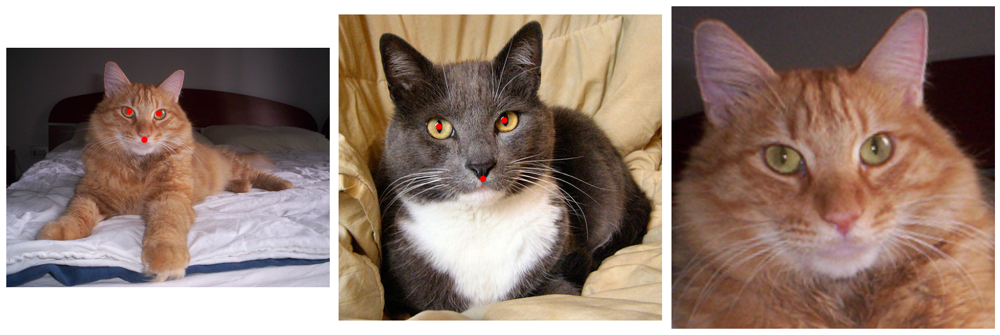

In [11]:
preprocess_one_cat()
# First image is the missing cat, second one the model cat 
# and the third one is the missing cat aligned and cropped
# Now there is a new file data/MissingCatProcessed.jpg

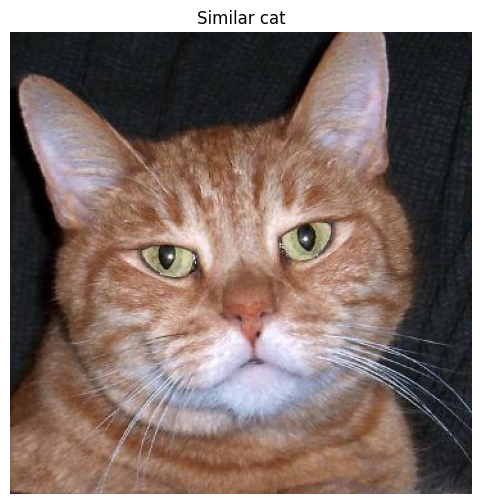

In [16]:
im_miss = io.imread("data/MissingCatProcessed.jpg")
im_miss_flat = im_miss.flatten()

#Subtract you missing cat data from all the rows in the data_matrix and for each 
#row compute the sum of squared differences. This can for example be done by:
sub_data = data_matrix - im_miss_flat
sub_distances = np.linalg.norm(sub_data, axis=1)
#Find the training cat that looks most like your missing cat by finding the cat, 
#where the SSD is smallest. You can for example use np.argmin.
min_idx = np.argmin(sub_distances)

similar_cat = create_u_byte_image_from_vector(data_matrix[min_idx, :], height, width, channels)

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plt.imshow(similar_cat)
ax.set_title("Similar cat")
ax.set_axis_off()
plt.show()

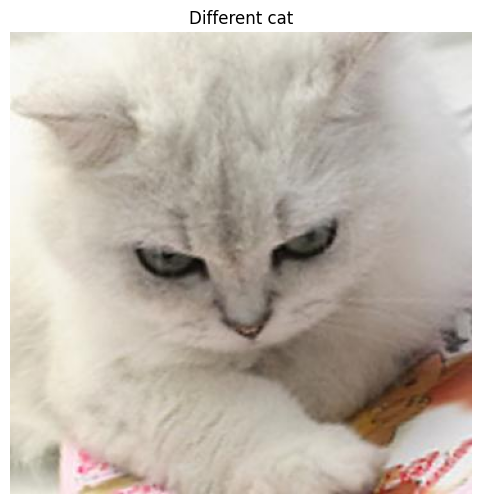

In [17]:
#find the cat that looks the most different

max_idx = np.argmax(sub_distances)
different_cat = create_u_byte_image_from_vector(data_matrix[max_idx, :], height, width, channels)
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plt.imshow(different_cat)
ax.set_title("Different cat")
ax.set_axis_off()
plt.show()

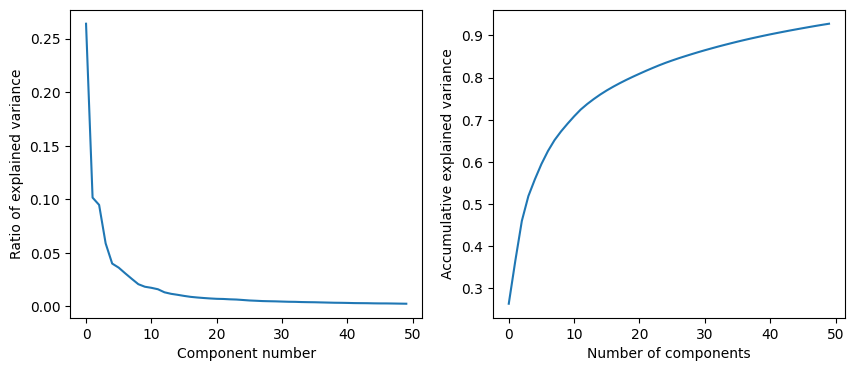

In [18]:
cats_pca = PCA(n_components=50)
cats_pca.fit(data_matrix)

explained_variance = cats_pca.explained_variance_ratio_
fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].plot(explained_variance)
ax[0].set_ylabel("Ratio of explained variance")
ax[0].set_xlabel("Component number")
ax[1].plot(explained_variance.cumsum())
ax[1].set_ylabel("Accumulative explained variance")
ax[1].set_xlabel("Number of components")
plt.show()

In [20]:
print("The first component explains {:.2f}% of the variance".format(explained_variance[0] * 100))

The first component explains 26.39% of the variance


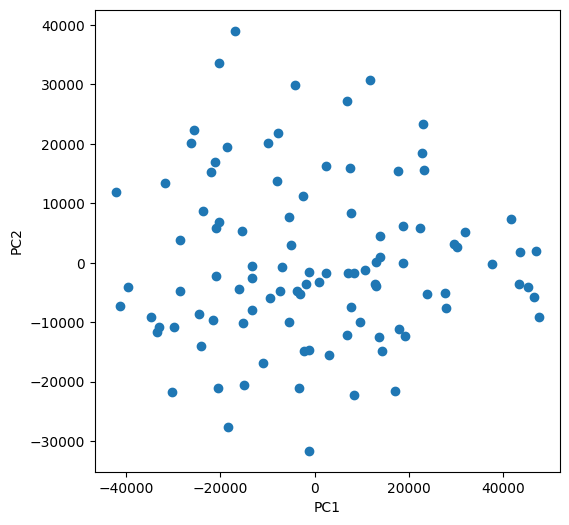

In [21]:
components = cats_pca.transform(data_matrix)
pc_1 = components[:, 0] 
pc_2 = components[:, 1]
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(pc_1, pc_2, "o")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
plt.show()

In [22]:
def nargmax(arr, n):
    # Like np.argmax but returns the n largest values
    idx = np.argpartition(arr, -n)[-n:]
    return idx[np.argsort(arr[idx])][::-1]

def nargmin(arr, n):
    # Like np.argmin but returns the n smallest values
    idx = np.argpartition(arr, n)[:n]
    return idx[np.argsort(arr[idx])]

def plot_pca_space_and_img(pc_idx):
    _, ax = plt.subplots(1, 2, figsize=(6, 3))
    ax[0].plot(pc_1, pc_2, "o")
    ax[0].plot(pc_1[pc_idx], pc_2[pc_idx], "ro", markersize=10)
    ax[0].set_xlabel("PC1")
    ax[0].set_ylabel("PC2")
    
    img = create_u_byte_image_from_vector(data_matrix[pc_idx, :], height, width, channels)
    ax[1].imshow(img)
    ax[1].set_title("Cat")
    ax[1].set_axis_off()
    plt.show()

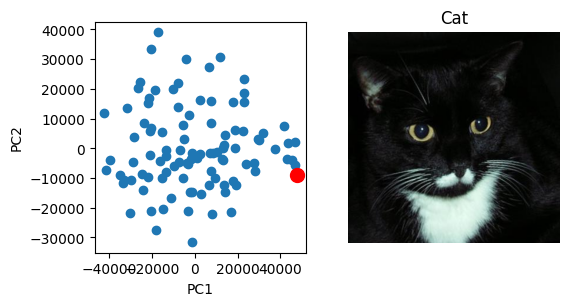

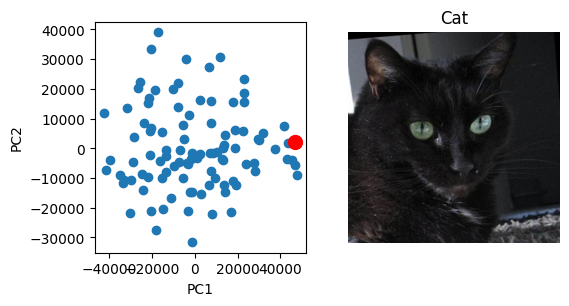

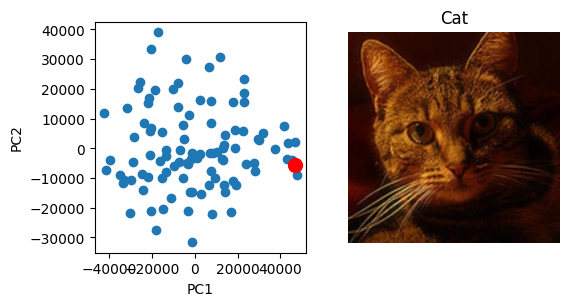

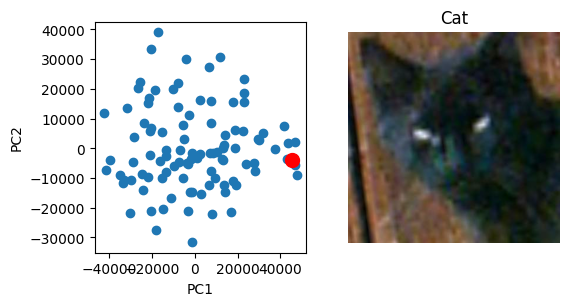

In [23]:
# Check the 4 largest values of PC1
max_pc1s = nargmax(pc_1, 4)
for i in max_pc1s:
    plot_pca_space_and_img(i)

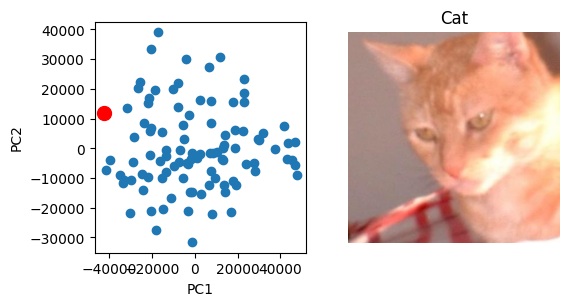

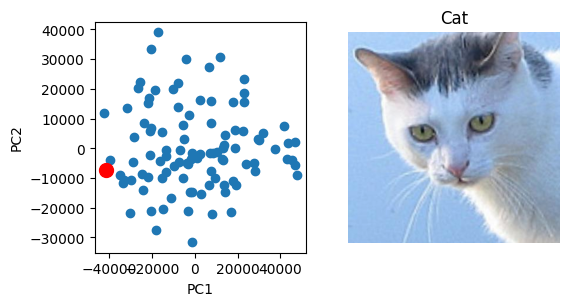

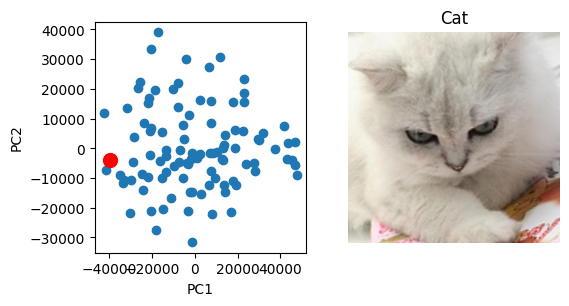

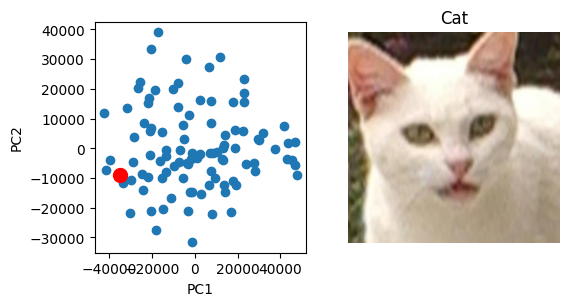

In [24]:
# Check the 4 smallest values of PC1
min_pc1s = nargmin(pc_1, 4)
for i in min_pc1s:
    plot_pca_space_and_img(i)

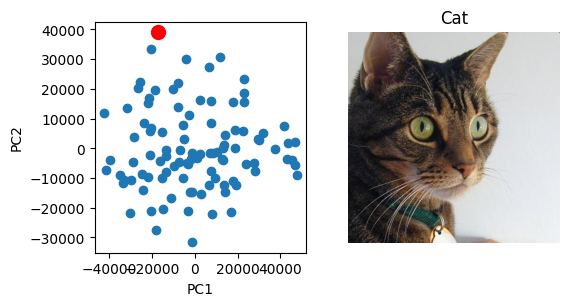

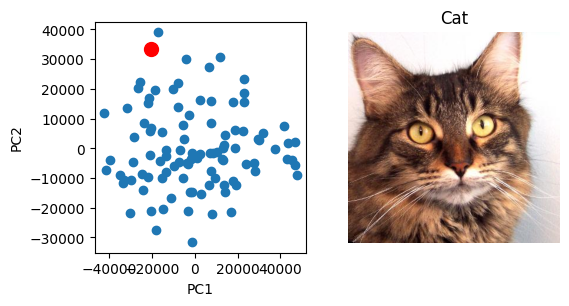

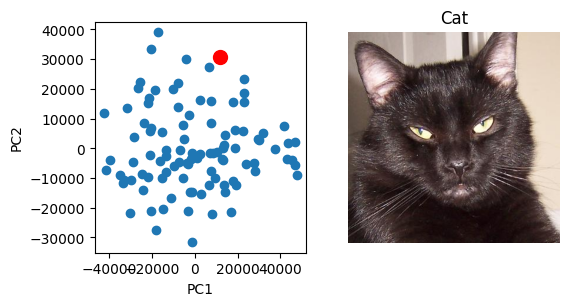

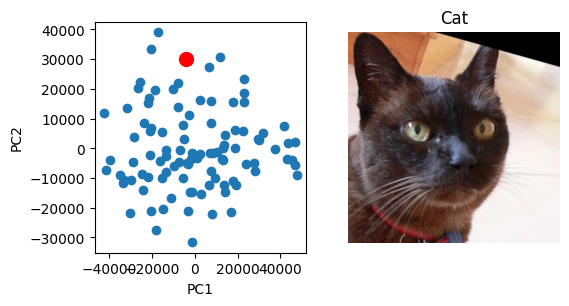

In [25]:
max_pc2s = nargmax(pc_2, 4)
for i in max_pc2s:
    plot_pca_space_and_img(i)

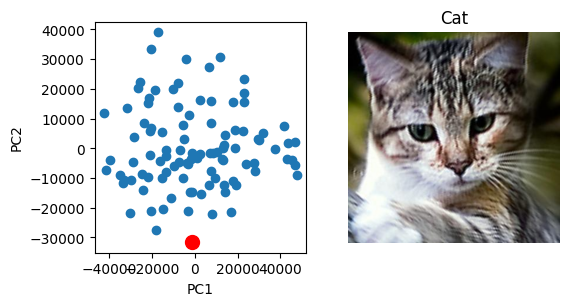

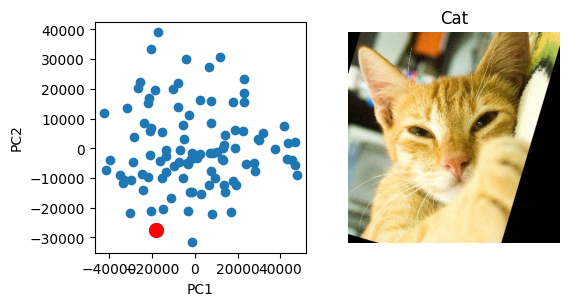

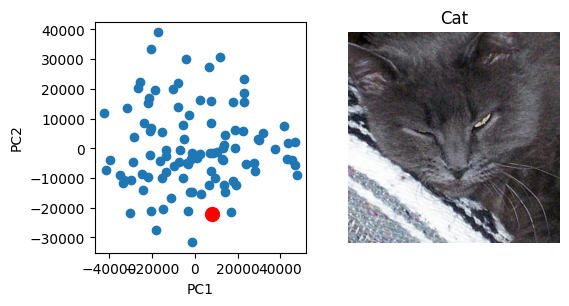

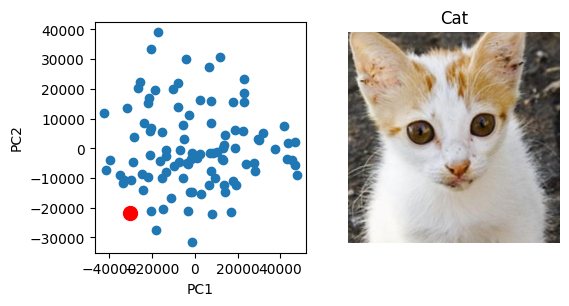

In [26]:
# Check the 4 smallest values of PC2
min_pc2s = nargmin(pc_2, 4)
for i in min_pc2s:
    plot_pca_space_and_img(i)

In [27]:
filtered_matrix = data_matrix.copy()

# Remove the 8 largest values of PC1, 5 smallest values of PC1,
# 5 largest values of PC2 and 5 smallest values of PC2
max_pc1s = nargmax(pc_1, 8)
min_pc1s = nargmin(pc_1, 5)
max_pc2s = nargmax(pc_2, 5)
min_pc2s = nargmin(pc_2, 5)

remove_idx = np.concatenate((max_pc1s, min_pc1s, max_pc2s, min_pc2s))
filtered_matrix = np.delete(filtered_matrix, remove_idx, axis=0)

# Recompute PCA
cats_pca = PCA(n_components=50)
cats_pca.fit(filtered_matrix)
components = cats_pca.transform(filtered_matrix)

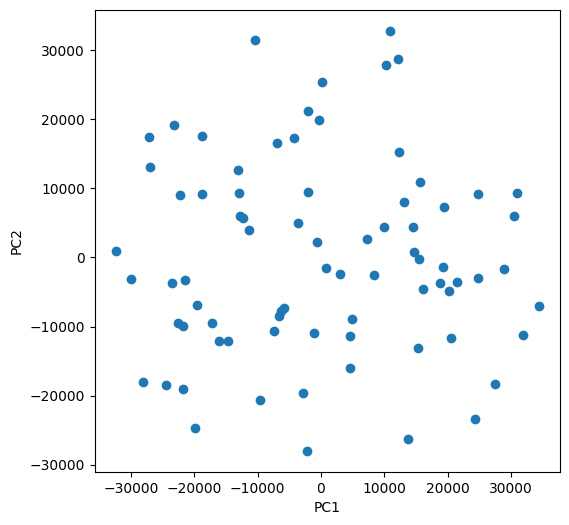

In [28]:
pc_1 = components[:, 0] 
pc_2 = components[:, 1]
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(pc_1, pc_2, "o")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
plt.show()

In [29]:
print("Maximal value of PC1: {:.8f}".format(np.max(cats_pca.components_[0, :])))
print("Minimal value of PC1: {:.8f}".format(np.min(cats_pca.components_[0, :])))

Maximal value of PC1: 0.00042115
Minimal value of PC1: -0.00298082


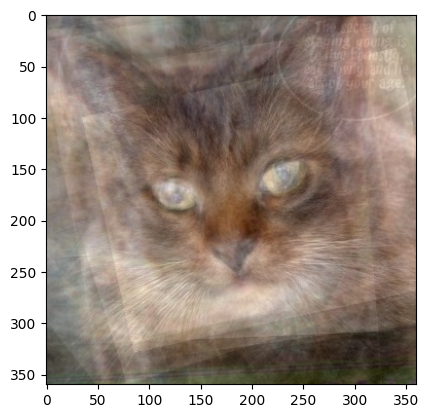

In [31]:
w = 60000
synth_cat = average_cat + w * cats_pca.components_[0, :]
synth_cat_img = create_u_byte_image_from_vector(synth_cat, height, width, channels)
plt.imshow(synth_cat_img)
plt.show()

In [32]:
print("Maximal value of PC2: {:.8f}".format(np.max(cats_pca.components_[1, :])))
print("Minimal value of PC2: {:.8f}".format(np.min(cats_pca.components_[1, :])))

Maximal value of PC2: 0.00432016
Minimal value of PC2: -0.00311991


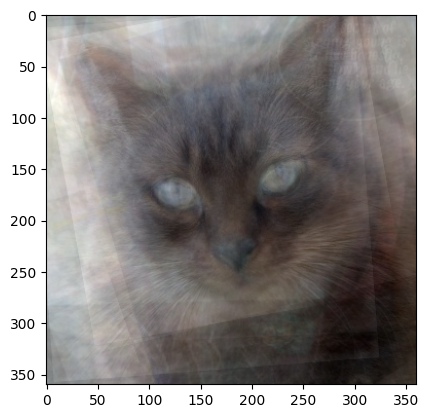

In [33]:
w0, w1 = 60000, 60000
synth_cat = average_cat + w0 * cats_pca.components_[0, :] + w1 * cats_pca.components_[1, :]
synth_cat_img = create_u_byte_image_from_vector(synth_cat, height, width, channels)
plt.imshow(synth_cat_img)
plt.show()

In [34]:
def visualize_mode_of_variation(m):
    synth_cat_plus = average_cat + 3 * np.sqrt(cats_pca.explained_variance_[m]) * cats_pca.components_[m, :]
    synth_cat_minus = average_cat - 3 * np.sqrt(cats_pca.explained_variance_[m]) * cats_pca.components_[m, :]
    
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(create_u_byte_image_from_vector(synth_cat_minus, height, width, channels))
    ax[0].set_title("Cat - 3$\sigma$")
    ax[1].imshow(create_u_byte_image_from_vector(average_cat, height, width, channels))
    ax[1].set_title("Average cat")
    ax[2].imshow(create_u_byte_image_from_vector(synth_cat_plus, height, width, channels))
    ax[2].set_title("Cat + 3$\sigma$")
    fig.suptitle("Mode of variation PC{}".format(m + 1))

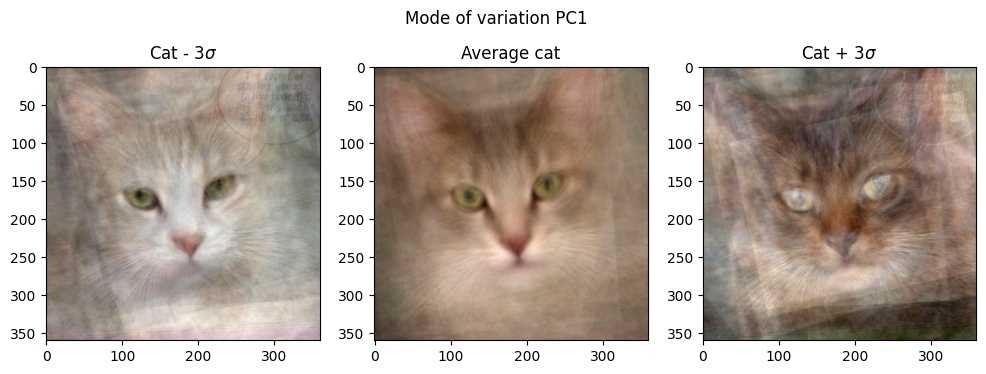

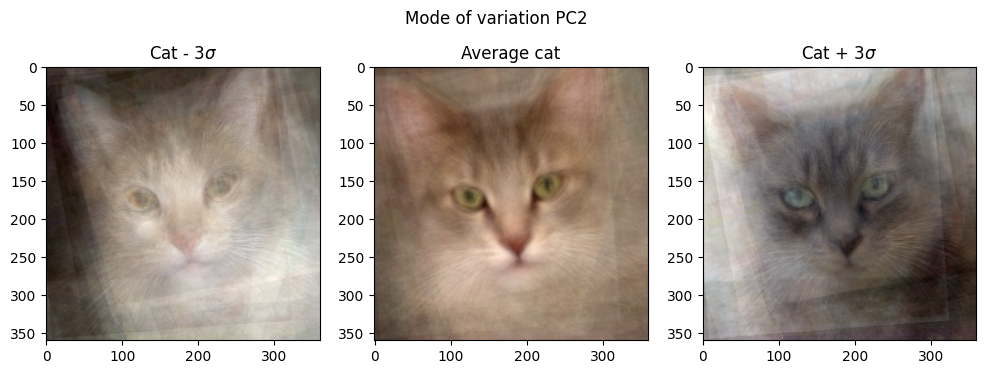

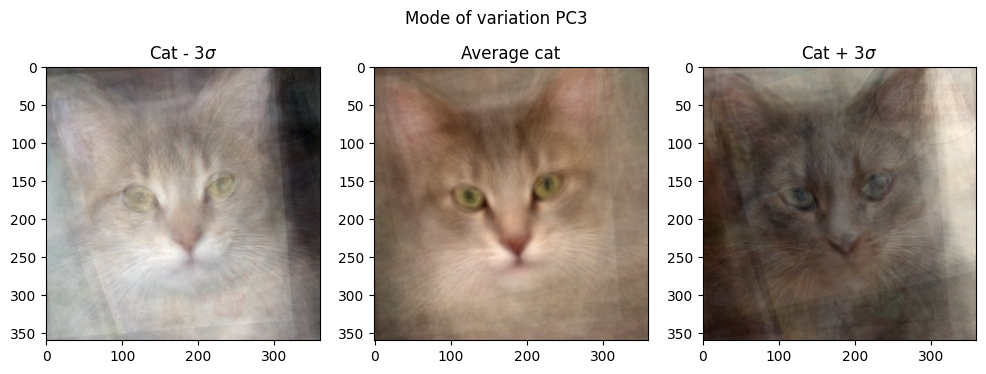

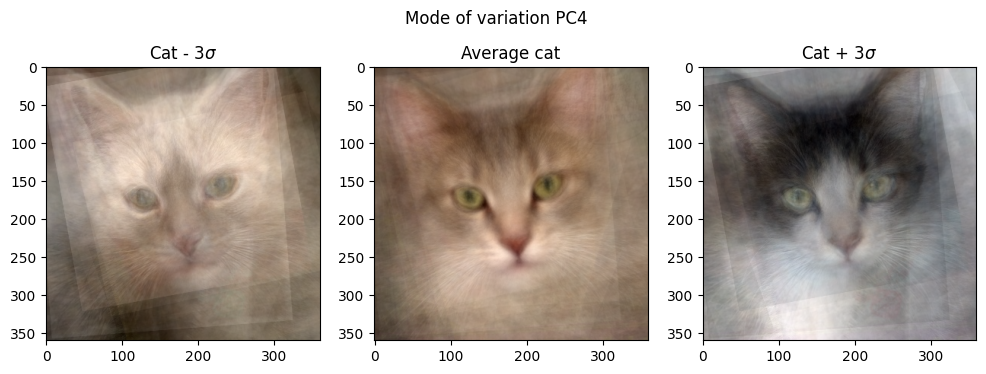

In [35]:
visualize_mode_of_variation(m = 0)
visualize_mode_of_variation(m = 1)
visualize_mode_of_variation(m = 2)
visualize_mode_of_variation(m = 3)

In [36]:
def random_cat_generator():
    w = np.random.randn(50)*50000
    w = w*np.exp(-np.arange(50)) # Decrease the influence of the higher PCs
    synth_cat = average_cat + np.dot(w, cats_pca.components_)
    return create_u_byte_image_from_vector(synth_cat, height, width, channels)

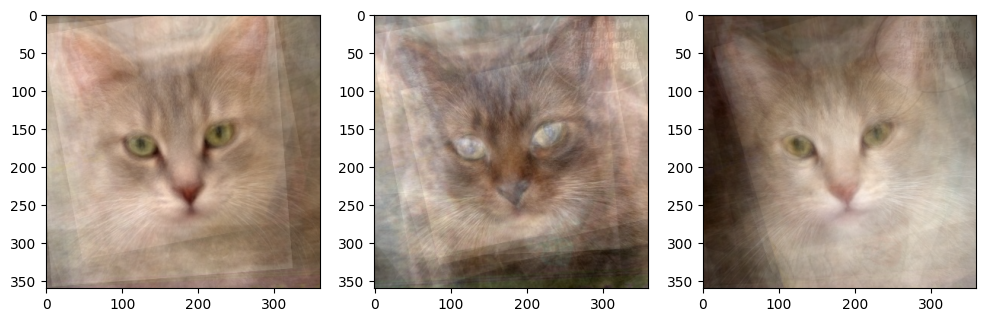

In [37]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(random_cat_generator())
ax[1].imshow(random_cat_generator())
ax[2].imshow(random_cat_generator())
plt.show()

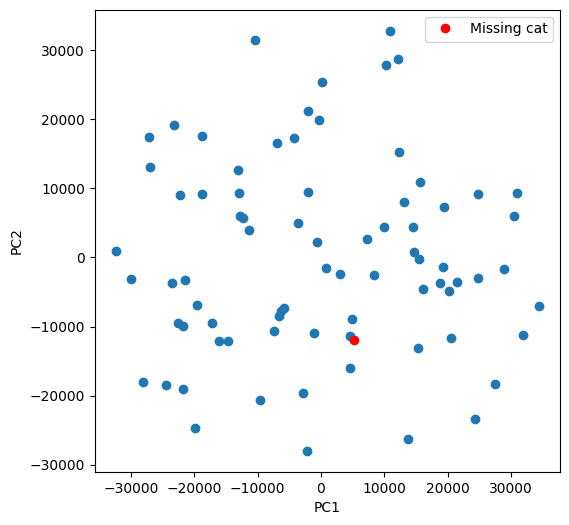

In [38]:
#Cat identification in PCA space
im_miss = io.imread("data/MissingCatProcessed.jpg")
im_miss_flat = im_miss.flatten()
im_miss_flat = im_miss_flat.reshape(1, -1)
pca_coords = cats_pca.transform(im_miss_flat)
pca_coords = pca_coords.flatten()

components = cats_pca.transform(filtered_matrix)
pc_1 = components[:, 0] 
pc_2 = components[:, 1]
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(pc_1, pc_2, "o")
ax.plot(pca_coords[0], pca_coords[1], "ro", label="Missing cat")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
plt.legend()
plt.show()

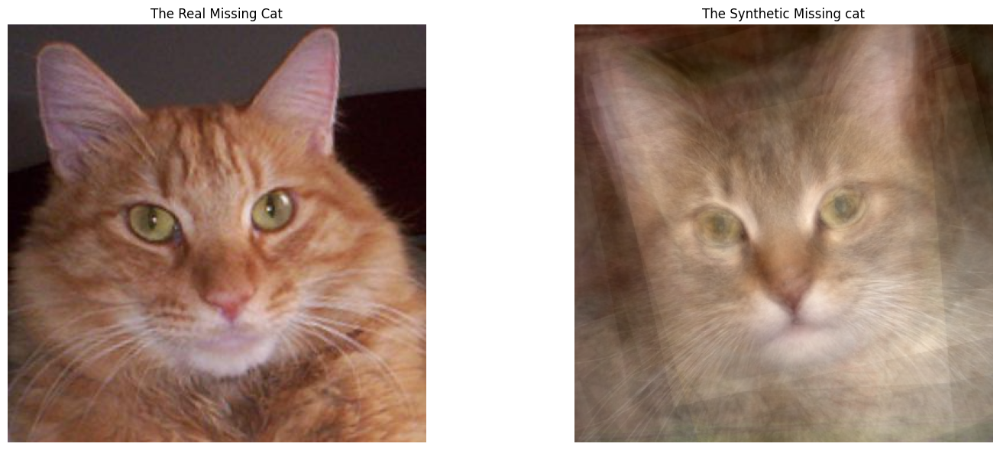

In [39]:
n_components_to_use = 10
synth_cat = average_cat
for idx in range(n_components_to_use):
	synth_cat = synth_cat + pca_coords[idx] * cats_pca.components_[idx, :]

fig, ax = plt.subplots(ncols=2, figsize=(16, 6))
ax[0].imshow(im_miss)
ax[0].set_title('The Real Missing Cat')
ax[1].imshow(create_u_byte_image_from_vector(synth_cat, height, width, channels))
ax[1].set_title('The Synthetic Missing cat')
for a in ax:
	a.axis('off')
plt.tight_layout()
plt.show()

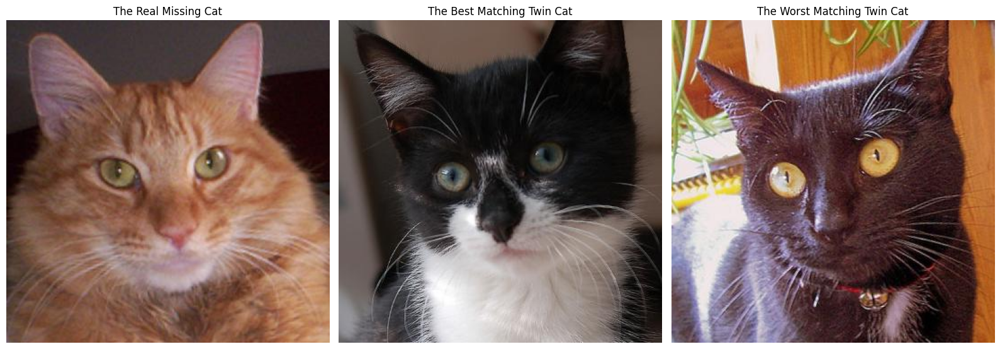

In [40]:
comp_sub = components - pca_coords
pca_distances = np.linalg.norm(comp_sub, axis=1)

best_match = np.argmin(pca_distances)
best_twin_cat = data_matrix[best_match, :]
worst_match = np.argmax(pca_distances)
worst_twin_cat = data_matrix[worst_match, :]
fig, ax = plt.subplots(ncols=3, figsize=(16, 6))
ax[0].imshow(im_miss)
ax[0].set_title('The Real Missing Cat')
ax[1].imshow(create_u_byte_image_from_vector(best_twin_cat, height, width, channels))
ax[1].set_title('The Best Matching Twin Cat')
ax[2].imshow(create_u_byte_image_from_vector(worst_twin_cat, height, width, channels))
ax[2].set_title('The Worst Matching Twin Cat')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

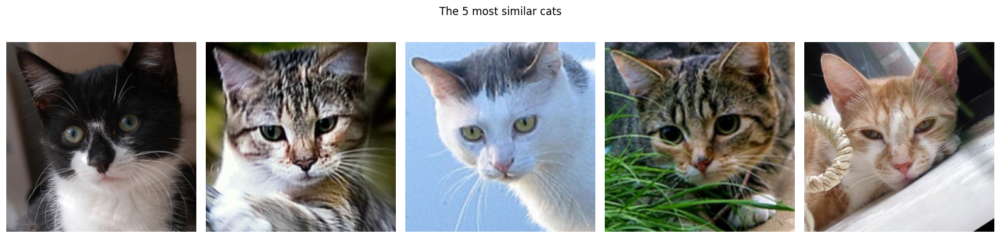

In [41]:
n_best = 5
best = np.argpartition(pca_distances, n_best)
fig, ax = plt.subplots(ncols=n_best, figsize=(16, 4))
for i in range(n_best):
    candidate_twin_cat = data_matrix[best[i], :]
    ax[i].imshow(create_u_byte_image_from_vector(candidate_twin_cat, height, width, channels))
    ax[i].axis('off')

fig.suptitle(f"The {n_best} most similar cats")
plt.tight_layout()
plt.show()